Eric Lindberg <br>
eric.lindberg@mdc-berlin.de

# Libraries

In [2]:
import os
import anndata
import logging
import numpy as np
import pandas as pd
from datetime import timedelta, datetime
import scanpy as sc
import seaborn as sns
import matplotlib.pyplot as plt
import leidenalg
import csv
from pandas import Timestamp
import re
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from scipy.stats import rankdata 
import scipy
import harmonypy as hm
import random
from SCCAF import *

In [170]:
sc.settings.verbosity =3
sc.logging.print_version_and_date()
sc.settings.set_figure_params(dpi=140, color_map='RdBu_r')
logging.getLogger("tensorflow").setLevel(logging.ERROR)
logging.getLogger("batchglm").setLevel(logging.INFO)
logging.getLogger("diffxpy").setLevel(logging.INFO)

Running Scanpy 1.5.1, on 2021-05-06 15:05.


In [4]:
random_state=10
date="20200528"
path_to_fast="/fast/AG_Huebner/"
path_in=path_to_fast+"huebner3/ANALYSES/20190926_gp_BadOyenhausen/scanpy/20210302/Subclusters"
path_out=path_to_fast+"huebner3/ANALYSES/20190926_gp_BadOyenhausen/scanpy/20210302/Immune"

# Subclustering of Myeloids only

In [15]:
MP_all=sc.read_h5ad(path_in + "/Myeloid_20210305_V1_RAW.h5ad")

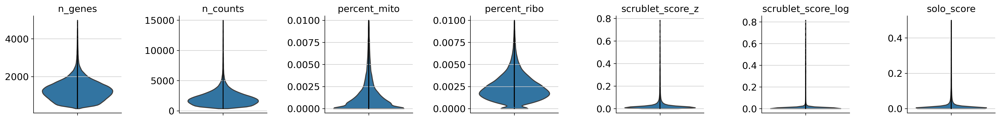

In [16]:
sc.pl.violin(MP_all, ['n_genes', 'n_counts', 'percent_mito', 'percent_ribo', "scrublet_score_z", 'scrublet_score_log', "solo_score"],
             jitter=0.001, multi_panel=True) 

In [17]:
sc.pp.normalize_per_cell(MP_all, counts_per_cell_after=1e4)
sc.pp.log1p(MP_all)
MP_all.raw=MP_all

normalizing by total count per cell
    finished (0:00:01): normalized adata.X and added    'n_counts', counts per cell before normalization (adata.obs)


extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


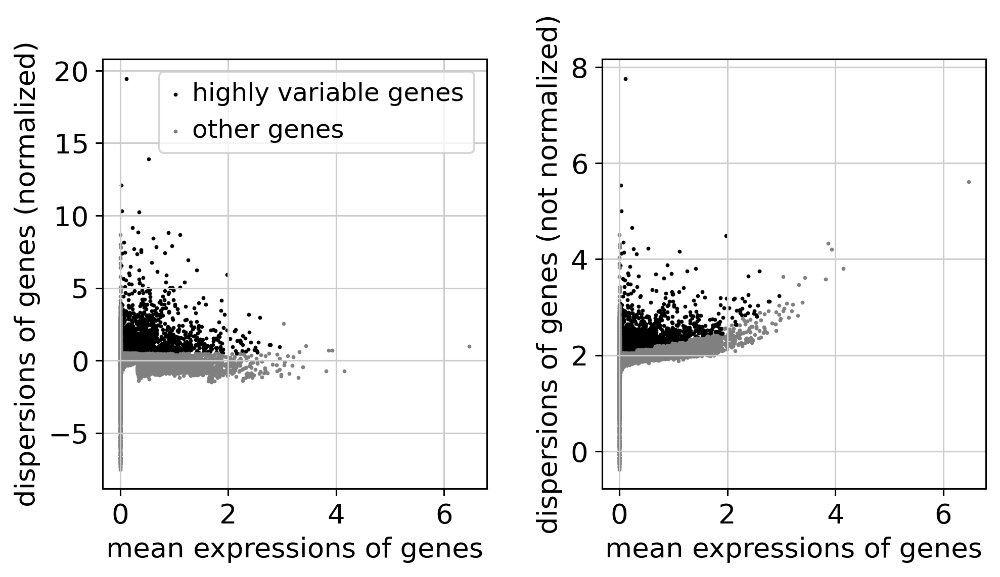

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:03:22)


(70036, 3265)

In [18]:
sc.pp.highly_variable_genes(MP_all) # 0.01 not that good results, 0.02 also not better + min_disp=0.7 also not better, min_mean=0.05, min_disp=1,  min_mean=0.03, min_disp=0.7 also not good
sc.pl.highly_variable_genes(MP_all)
MP_all_hvg = MP_all[:, MP_all.var['highly_variable']]
sc.pp.regress_out(MP_all_hvg, ['n_counts', 'percent_mito'])
sc.pp.scale(MP_all_hvg, max_value = 10)
MP_all_hvg.shape

In [ ]:
# Check wether some discriminative genes are in the HVGs
MP_all[:,['VCAN', 'ITGAX', 'C9', 'CD163L1', 'CD1C']].var

In [20]:
sc.tl.pca(MP_all_hvg, svd_solver = 'arpack', random_state = random_state, n_comps=70)

computing PCA
    on highly variable genes
    with n_comps=70
    finished (0:00:15)


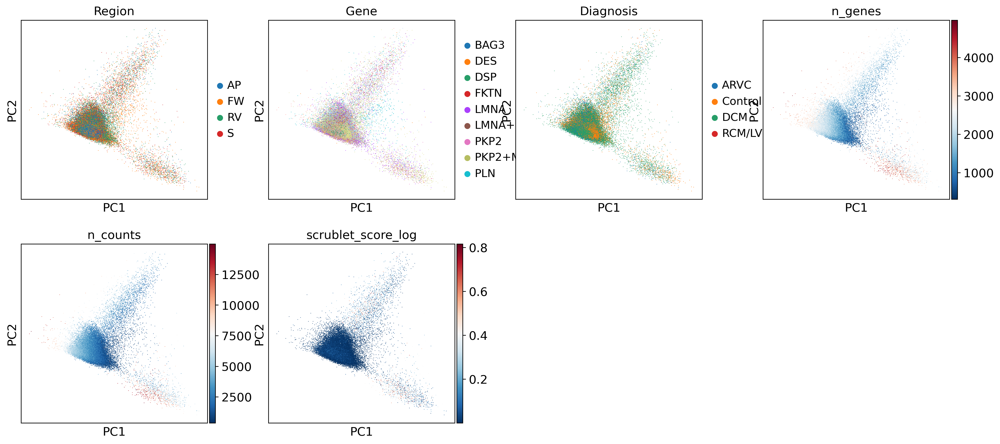

In [21]:
sc.pl.pca(MP_all_hvg, color = ['Region', 'Gene', 'Diagnosis', 'n_genes', 'n_counts', 'scrublet_score_log'])

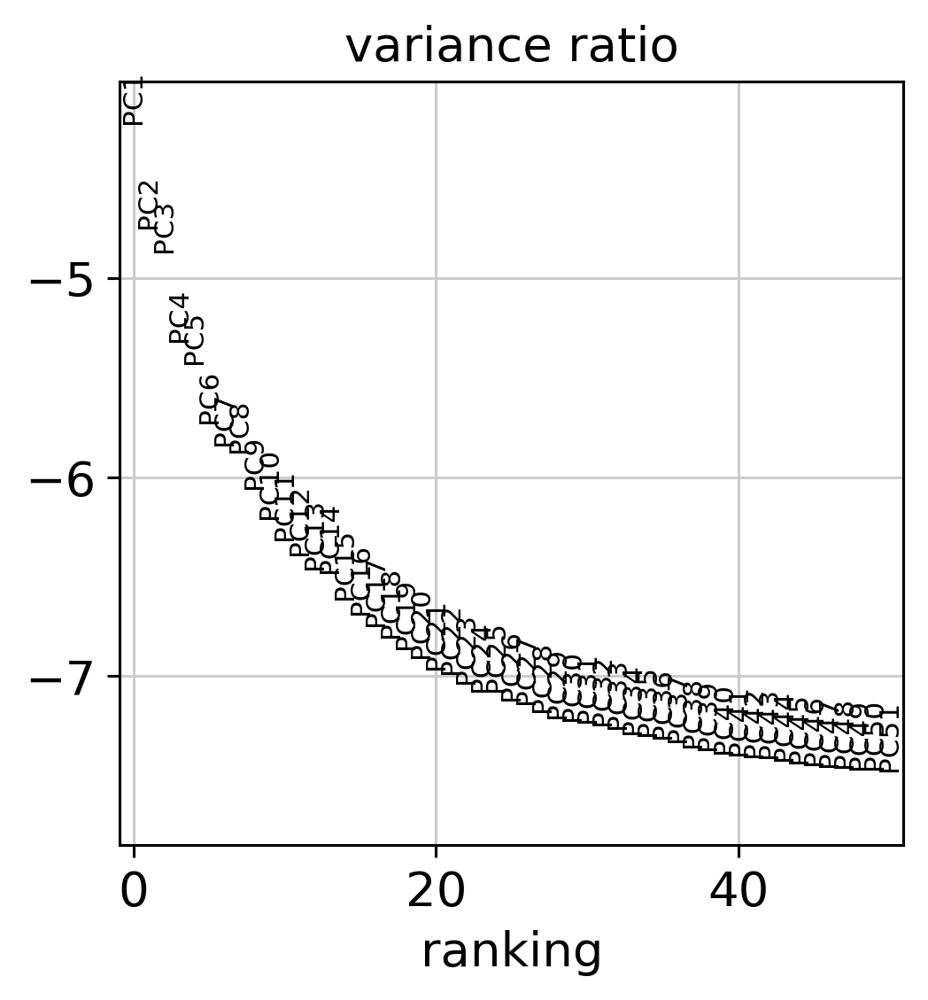

In [22]:
sc.pl.pca_variance_ratio(MP_all_hvg, log=True, n_pcs=50)

In [23]:
num_pcs= 32 

In [24]:
pca = MP_all_hvg.obsm['X_pca']
meta_data = MP_all_hvg.obs
MP_harmony=MP_all_hvg.copy()

In [25]:
ho = hm.run_harmony(pca, meta_data, ['Patient'], random_state=random_state, 
                    epsilon_harmony = -float('Inf'), epsilon_cluster = -float('Inf'))

2021-03-18 17:31:17,581 - harmonypy - INFO - Iteration 1 of 10
2021-03-18 17:31:57,716 - harmonypy - INFO - Iteration 2 of 10
2021-03-18 17:32:36,879 - harmonypy - INFO - Iteration 3 of 10
2021-03-18 17:33:10,787 - harmonypy - INFO - Iteration 4 of 10
2021-03-18 17:33:44,250 - harmonypy - INFO - Iteration 5 of 10
2021-03-18 17:34:18,396 - harmonypy - INFO - Iteration 6 of 10
2021-03-18 17:34:52,887 - harmonypy - INFO - Iteration 7 of 10
2021-03-18 17:35:28,192 - harmonypy - INFO - Iteration 8 of 10
2021-03-18 17:36:04,624 - harmonypy - INFO - Iteration 9 of 10
2021-03-18 17:36:39,033 - harmonypy - INFO - Iteration 10 of 10
2021-03-18 17:37:14,539 - harmonypy - INFO - Stopped before convergence


In [26]:
res = pd.DataFrame(ho.Z_corr)
res=res.T
MP_harmony.obsm['X_pca'] = res.values

In [27]:
sc.pp.neighbors(MP_harmony, n_pcs=num_pcs, random_state=random_state, n_neighbors= 40) ###### 

computing neighbors
    using 'X_pca' with n_pcs = 32


/fast/AG_Huebner/GUIX_PROFILES/conda_envs/scanpy_151/lib/python3.8/site-packages/numba/np/ufunc/parallel.py:355: NumbaWarning: The TBB threading layer requires TBB version 2019.5 or later i.e., TBB_INTERFACE_VERSION >= 11005. Found TBB_INTERFACE_VERSION = 6103. The TBB threading layer is disabled.
  warnings.warn(problem)


    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:24)


In [28]:
sc.tl.umap(MP_harmony, random_state = random_state, min_dist = 0.3) # , min_dist = 0.01, spread=1.5, n_components=2 

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:01:44)


In [29]:
sc.tl.leiden(MP_harmony, resolution = 0.5, random_state = random_state, key_added='leiden_05')
sc.tl.leiden(MP_harmony, resolution = 0.8, random_state = random_state, key_added='leiden_08')

running Leiden clustering
    finished: found 13 clusters and added
    'leiden_05', the cluster labels (adata.obs, categorical) (0:01:52)
running Leiden clustering
    finished: found 15 clusters and added
    'leiden_08', the cluster labels (adata.obs, categorical) (0:02:56)


Trying to set attribute `.uns` of view, copying.


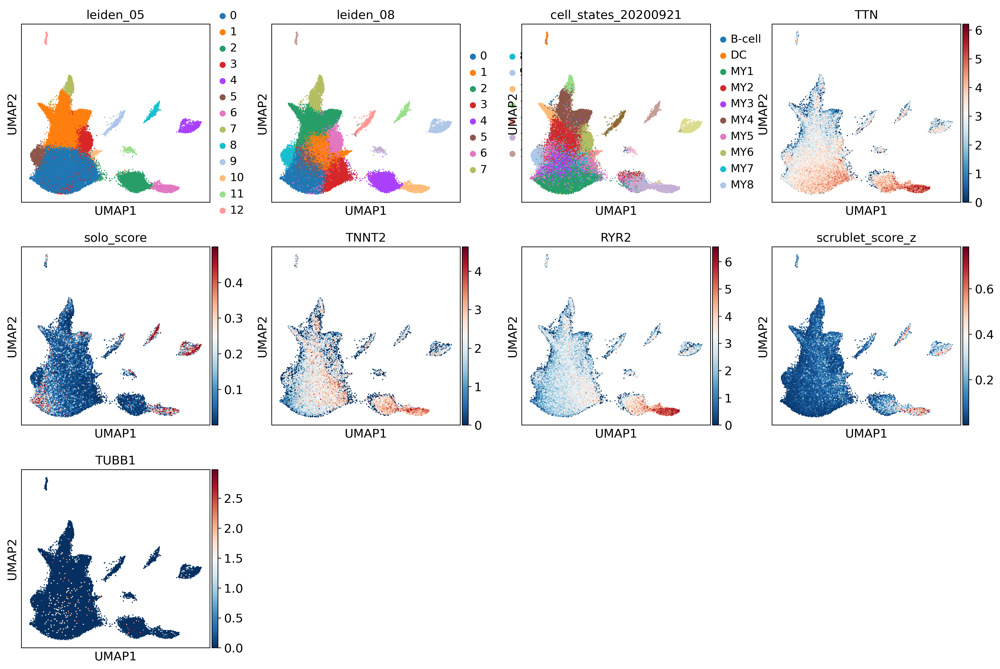

In [30]:
sc.pl.umap(MP_harmony[MP_harmony.obs.cell_type_20200921.isin(['Myeloid'])],
           color=['leiden_05', 'leiden_08', 'cell_states_20200921', 'TTN', 'solo_score', 'TNNT2', 'RYR2',
                  'scrublet_score_z', 'TUBB1'
                 ], 
           projection='2d', size=8)

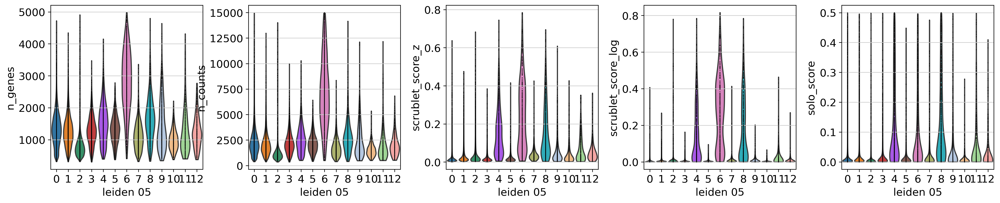

In [47]:
sc.pl.violin(MP_harmony, ['n_genes', 'n_counts', "scrublet_score_z", 'scrublet_score_log', "solo_score"],
             jitter=0.001, multi_panel=True, groupby="leiden_05") 

Cluster 2, 4 and 6 and 8 are most likely chimeric states, as they show high overlap with canonical CM, PC and MP markers. To obatin a finer annotation for the remaining clusters, we take them and recluster them again, see section below. 

In [45]:
#MP_harmony.write(path_out + "/Myeloid_DOUBLETS.h5ad")
#MP_harmony.obs.to_csv(path_out + "/Myeloid_DOUBLETS_OBS.csv")

## Remove nuclei with background/unfiltered doublets 

In [36]:
MP_all_nobackground=MP_all[~MP_harmony.obs.leiden_05.isin(['2', '4', '6', '8'])].copy()

extracting highly variable genes
    finished (0:00:03)
--> added
    'highly_variable', boolean vector (adata.var)
    'means', float vector (adata.var)
    'dispersions', float vector (adata.var)
    'dispersions_norm', float vector (adata.var)


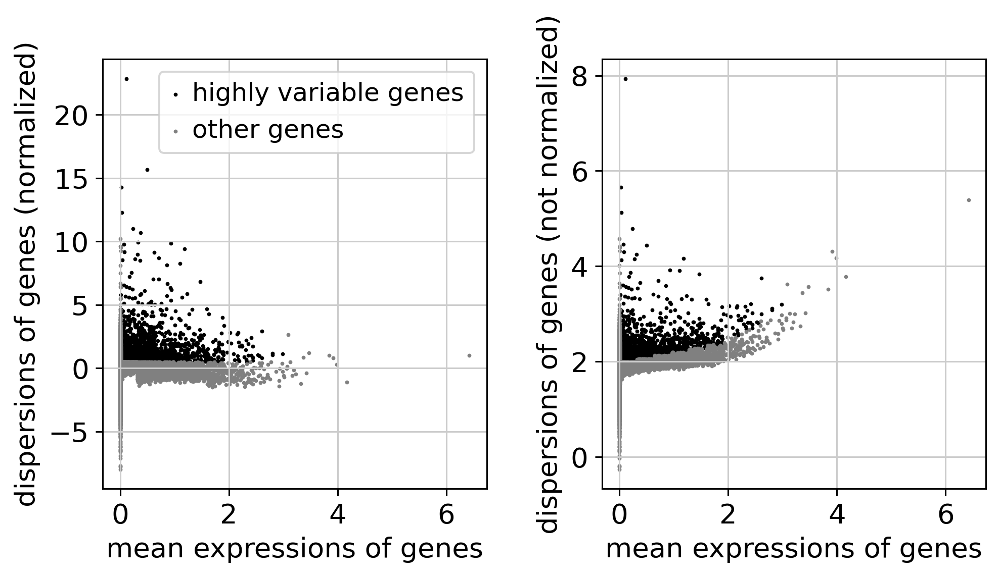

regressing out ['n_counts', 'percent_mito']
    sparse input is densified and may lead to high memory use
    finished (0:02:32)


(59217, 3436)

In [37]:
sc.pp.highly_variable_genes(MP_all_nobackground)
sc.pl.highly_variable_genes(MP_all_nobackground)
MP_all_all_nobackground_hvg = MP_all_nobackground[:, MP_all_nobackground.var['highly_variable']]
sc.pp.regress_out(MP_all_all_nobackground_hvg, ['n_counts', 'percent_mito'])
sc.pp.scale(MP_all_all_nobackground_hvg, max_value = 10)
MP_all_all_nobackground_hvg.shape

In [38]:
sc.tl.pca(MP_all_all_nobackground_hvg, svd_solver = 'arpack', random_state = random_state)

computing PCA
    on highly variable genes
    with n_comps=50
    finished (0:00:07)


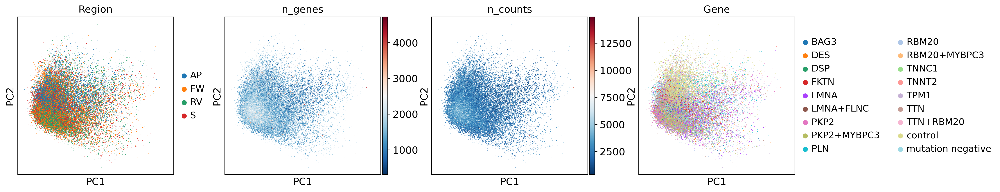

In [39]:
sc.pl.pca(MP_all_all_nobackground_hvg, color = ['Region', 'n_genes', 'n_counts', 'Gene'])

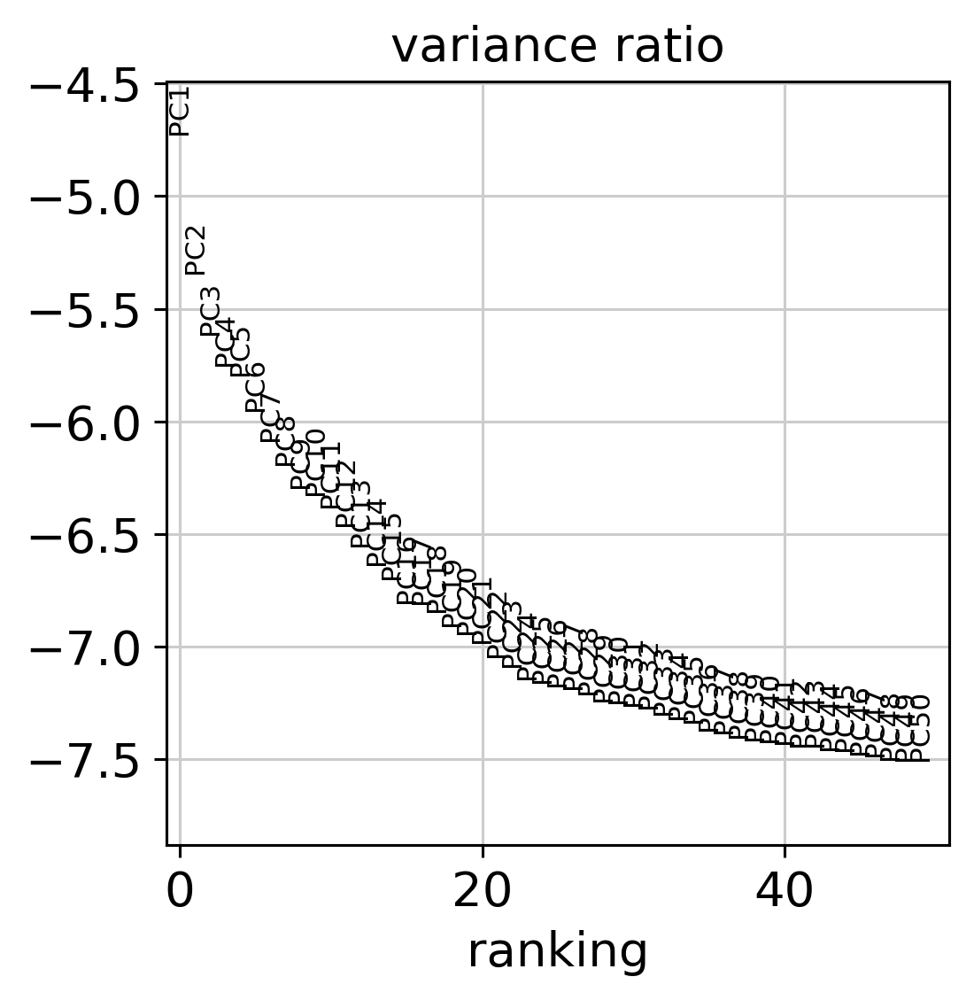

In [40]:
sc.pl.pca_variance_ratio(MP_all_all_nobackground_hvg, log=True, n_pcs=50)

In [42]:
num_pcs= 34 

In [43]:
pca = MP_all_all_nobackground_hvg.obsm['X_pca']
meta_data = MP_all_all_nobackground_hvg.obs
MP_all_nobackground_harmony=MP_all_all_nobackground_hvg.copy()

In [44]:
ho = hm.run_harmony(pca, meta_data, ['Patient'], 
                    epsilon_harmony = -float('Inf'), epsilon_cluster = -float('Inf'), 
                    random_state=random_state)

2021-03-10 22:16:16,281 - harmonypy - INFO - Iteration 1 of 10
2021-03-10 22:16:42,718 - harmonypy - INFO - Iteration 2 of 10
2021-03-10 22:17:08,794 - harmonypy - INFO - Iteration 3 of 10
2021-03-10 22:17:36,264 - harmonypy - INFO - Iteration 4 of 10
2021-03-10 22:18:00,378 - harmonypy - INFO - Iteration 5 of 10
2021-03-10 22:18:28,243 - harmonypy - INFO - Iteration 6 of 10
2021-03-10 22:18:52,940 - harmonypy - INFO - Iteration 7 of 10
2021-03-10 22:19:17,064 - harmonypy - INFO - Iteration 8 of 10
2021-03-10 22:19:40,784 - harmonypy - INFO - Iteration 9 of 10
2021-03-10 22:20:09,431 - harmonypy - INFO - Iteration 10 of 10
2021-03-10 22:20:35,911 - harmonypy - INFO - Stopped before convergence


In [45]:
res = pd.DataFrame(ho.Z_corr)
res=res.T

In [46]:
MP_all_nobackground_harmony.obsm['X_pca'] = res.values
sc.pp.neighbors(MP_all_nobackground_harmony, n_pcs=num_pcs, random_state=random_state, n_neighbors= 15) # 40

computing neighbors
    using 'X_pca' with n_pcs = 34
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:00:20)


In [47]:
sc.tl.umap(MP_all_nobackground_harmony, 
           random_state = random_state, min_dist = 0.1, spread = 1, n_components=2)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm) (0:00:54)


In [10]:
#MP_all_nobackground_harmony.write(path_out + "MP_nodoublets_LEIDEN.h5ad")
MP_all_nobackground_harmony=sc.read_h5ad(path_out + "MP_nodoublets_LEIDEN.h5ad")

In [ ]:
#MP_all_nobackground_harmony.write(path_out+"/Myeloid_NODOUBLET_LEIDEN.h5ad")

In [50]:
i=1.1
sc.tl.leiden(MP_all_nobackground_harmony, 
                 resolution = i, 
                 random_state = random_state, 
                 key_added="leiden_" + re.sub("\\.", "", str(i)))

running Leiden clustering
    finished: found 18 clusters and added
    'leiden_11', the cluster labels (adata.obs, categorical) (0:00:59)


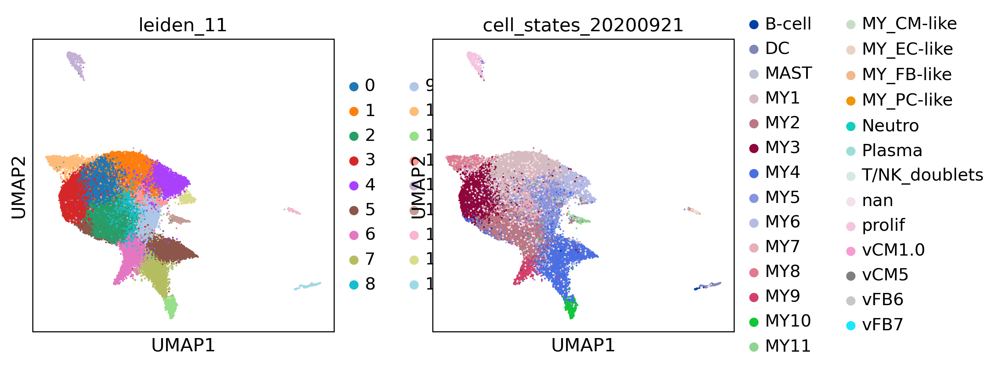

In [77]:
sc.pl.umap(MP_all_nobackground_harmony,
           color=['leiden_11', 'cell_states_20200921'], 
           projection='2d', size=8)

In [52]:
x_cntrl=MP_all_nobackground_harmony[MP_all_nobackground_harmony.obs.Gene.isin(['control'])].copy()
subset_=sc.AnnData(x_cntrl[:,x_cntrl.var.index].raw.X, # 
                  obs=x_cntrl.obs,
                  var=x_cntrl[:,x_cntrl.var.index].raw.var
                 )

subset_.raw=subset_

x=correlation_analysis(subset_, 'leiden_11', sum_or_mean="mean")
x=pd.DataFrame.from_dict(x)
x['leiden_11']=subset_.var.index
x.iloc[:,0:17]=x.iloc[:,0:17].apply(lambda r: np.log(r+1))

x.corr(method='pearson').style.background_gradient(cmap='coolwarm')

,0,1,10,11,12,13,14,15,16,17,2,3,4,5,6,7,8,9
0,1.000000,0.985149,0.974474,0.889413,0.956810,0.940413,0.936210,0.945503,0.943396,0.812205,0.982884,0.986743,0.977917,0.948410,0.944484,0.919761,0.971143,0.959467
1,0.985149,1.000000,0.973730,0.904029,0.956622,0.946137,0.926302,0.944937,0.945078,0.811125,0.975362,0.979511,0.982566,0.952212,0.940246,0.935276,0.969609,0.969959
10,0.974474,0.973730,1.000000,0.901071,0.950655,0.936458,0.919742,0.934820,0.938296,0.818382,0.971638,0.970405,0.969232,0.946108,0.944384,0.927124,0.964237,0.953581
11,0.889413,0.904029,0.901071,1.000000,0.908180,0.890665,0.866792,0.890157,0.889780,0.840857,0.912172,0.902505,0.910046,0.937100,0.931511,0.960639,0.903071,0.907777
12,0.956810,0.956622,0.950655,0.908180,1.000000,0.934964,0.919192,0.927417,0.931232,0.823486,0.961374,0.960723,0.962476,0.947829,0.945850,0.933066,0.960139,0.942694
13,0.940413,0.946137,0.936458,0.890665,0.934964,1.000000,0.903960,0.921359,0.911425,0.825373,0.951345,0.946155,0.945645,0.939066,0.933506,0.922006,0.939085,0.929025
14,0.936210,0.926302,0.919742,0.866792,0.919192,0.903960,1.000000,0.907367,0.895533,0.800093,0.941851,0.936304,0.925090,0.920346,0.922795,0.898464,0.922211,0.918594
15,0.945503,0.944937,0.934820,0.890157,0.927417,0.921359,0.907367,1.000000,0.912026,0.823164,0.948560,0.944915,0.942993,0.937300,0.931049,0.919769,0.935932,0.923390
16,0.943396,0.945078,0.938296,0.889780,0.931232,0.911425,0.895533,0.912026,1.000000,0.800849,0.948936,0.942479,0.958619,0.932332,0.931611,0.915619,0.941225,0.928234
17,0.812205,0.811125,0.818382,0.840857,0.823486,0.825373,0.800093,0.823164,0.800849,1.000000,0.841828,0.821314,0.814083,0.854424,0.869654,0.849140,0.825699,0.807701


In [ ]:
sc.tl.rank_genes_groups(MP_all_nobackground_harmony, 'leiden_11', method='wilcoxon')
sc.pl.rank_genes_groups(MP_all_nobackground_harmony, n_genes=25, sharey=False)

In [321]:
expression=filter_by_expression(MP_all_nobackground_harmony, 'leiden_11', key='rank_genes_groups')
expression.head(n=5)

,0_na,0_pv,0_lo,0_pi,0_po,0_ei,0_eo,1_na,1_pv,1_lo,...,16_po,16_ei,16_eo,17_na,17_pv,17_lo,17_pi,17_po,17_ei,17_eo
0,MAN1A1,0.0,1.493879,0.949066,0.782937,3.459939,2.479967,F13A1,0.0,1.800414,...,0.039919,0.914677,0.072548,CCSER1,2.690556e-78,4.527600,0.620525,0.152335,2.213351,0.302471
1,F13A1,0.0,1.694530,0.968194,0.768522,3.994031,2.859849,STAB1,0.0,1.717220,...,0.184649,1.279292,0.341568,WDFY4,3.644733e-71,3.769428,0.639618,0.253648,2.211089,0.467414
2,NAV2,0.0,1.689282,0.743216,0.426481,2.081937,1.155866,AP2A2,0.0,1.280778,...,0.077472,0.984632,0.144499,CLNK,6.280234e-65,7.755208,0.501193,0.012824,1.775650,0.022445
3,AP000311.1,0.0,1.525558,0.704738,0.417282,1.651349,0.901670,TNS3,0.0,1.010525,...,0.501141,1.923218,1.104219,CD74,1.055683e-60,2.302220,0.742243,0.407361,2.157495,0.936460
4,AUTS2,0.0,1.401183,0.806828,0.544629,2.216794,1.410086,TTN,0.0,1.342737,...,0.021262,1.029786,0.047981,FLT3,1.141453e-60,4.461902,0.527446,0.075462,1.574257,0.160130


In [322]:
#expression.to_csv(path_in + "/Myeloid_20210305_V1_MARKERGENES.CSV")

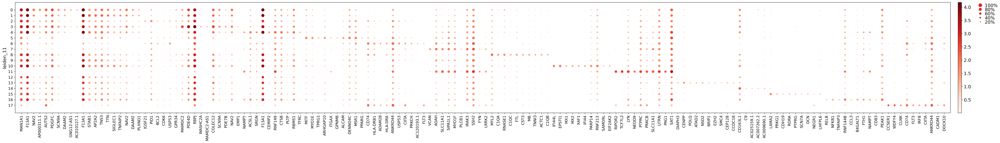

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[52.5, 0, 0.2, 0.5, 0.25])

In [61]:
sc.pl.dotplot(MP_all_nobackground_harmony,
              makevector_topmarkers(MP_all_nobackground_harmony, 
                                    10, ldFC_cutoff=1, pvals_adj_cutoff=10**-10, expression_in=0.8),
              groupby='leiden_11', use_raw=True)

## Markers for CCR2+/- markers 

In [115]:
# This markers have been previously reported by a publication of Bajpai et al. 
marker_genes={'recruited CCR2+': ['GDF3', 'IL10', 'AREG', 'ARG1', 'CCL2', 'CCL7', 'IL1B', 'CXCL1', 'EREG','MRC1', 'HIF1A', 'CXCL2', 'ACSL1', 'NAMPT', 'CTSB', 'PLTP'],
              'resident CCR2+': ['ACE', 'FLT1', 'NOD1', 'IRF5', 'IRF7', 'ISG15', 'IRF1', 'TNF', 'MX1', 'IFIT3'],
             'CCR2+':['IL1R2', 'REL', 'TRAF1', 'IRAK2', 'NFKBIE', 'NFKB1', 'OSM', 'IL10'],
             "CCR2-":['IL2RA', 'PDGFC', 'WLS', 'DAB2', 'NRP1', 'SCN9A', 'FGF13', 'FCGR1A', 'LILRB5', 'CD163','MRC1', 'MAF', 'SIGLEC1', 'LYVE1'],
             'CCR2- text':['IGF1', 'PDGFC', 'EGFL7', 'GDF15', 'NRP1', 'SLIT3', 'ECM1', 'SDC3', 'SCN9A', 'FGF13']
             }

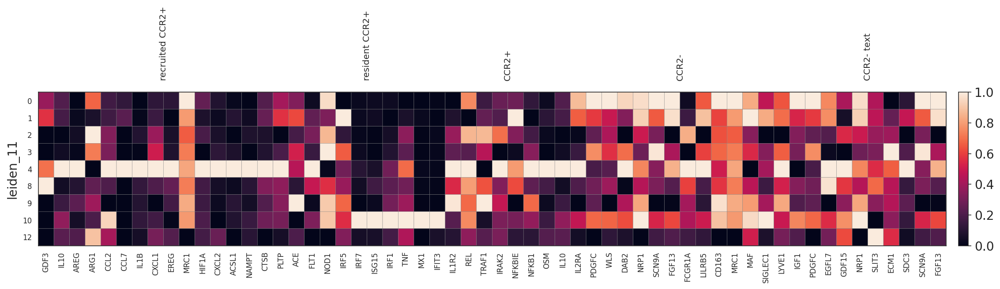

GridSpec(2, 3, height_ratios=[0.5, 10], width_ratios=[18.56, 0, 0.2])

In [461]:
sc.pl.matrixplot(MP_all_nobackground_harmony[~MP_all_nobackground_harmony.obs.leiden_11.isin(['5', '6', '7', '13','17', '11', '14', '15', '16'])],
              marker_genes,
              groupby='leiden_11', use_raw=True, standard_scale="var")

# TREM2 signature

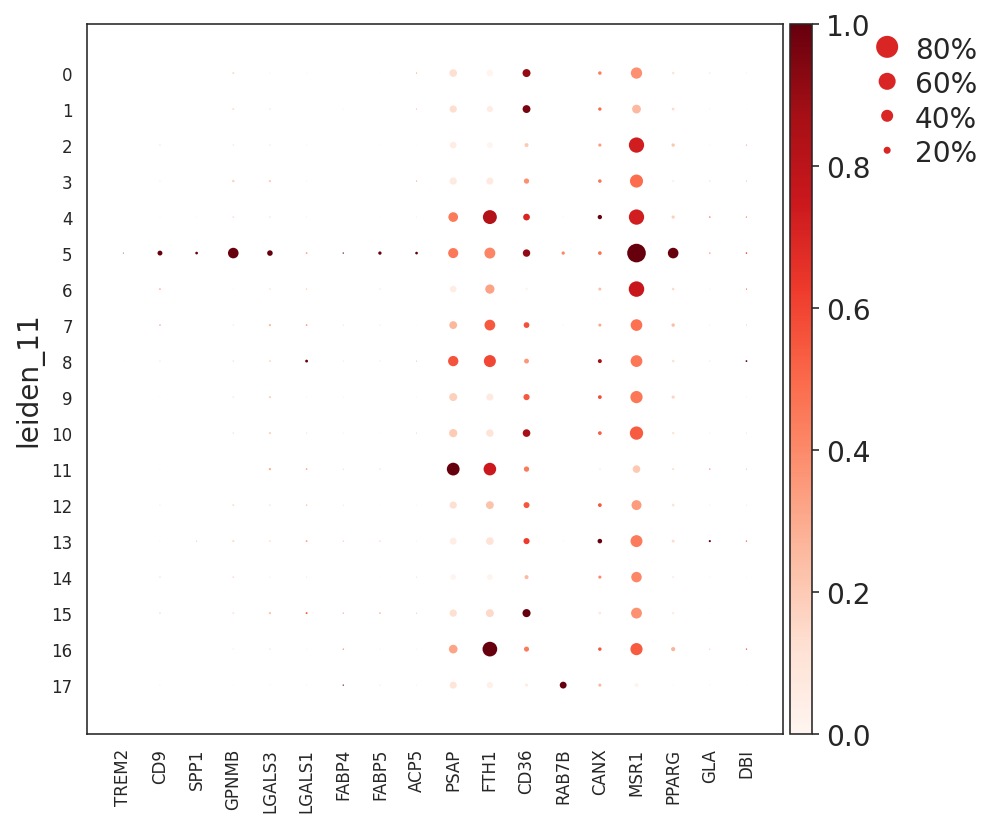

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[6.3, 0, 0.2, 0.5, 0.25])

In [234]:
# Trem2 macrophages have been previously intensively studied in the heart. However, TREM2 itself is very lowly
# detected in nuc-seq
sc.pl.dotplot(MP_all_nobackground_harmony,#[MP_all_nobackground_harmony.obs.leiden_11.isin(['5'])],
              ['TREM2', 'CD9', 'SPP1', 'GPNMB', 'LGALS3', 'LGALS1',
              'FABP4', 'FABP5', 'ACP5', 'PSAP', 'FTH1', 'CD36', 'RAB7B', 'CANX', 'MSR1', 'PPARG', 'GLA', 'DBI'
              ],
              groupby='leiden_11', use_raw=True, standard_scale="var")

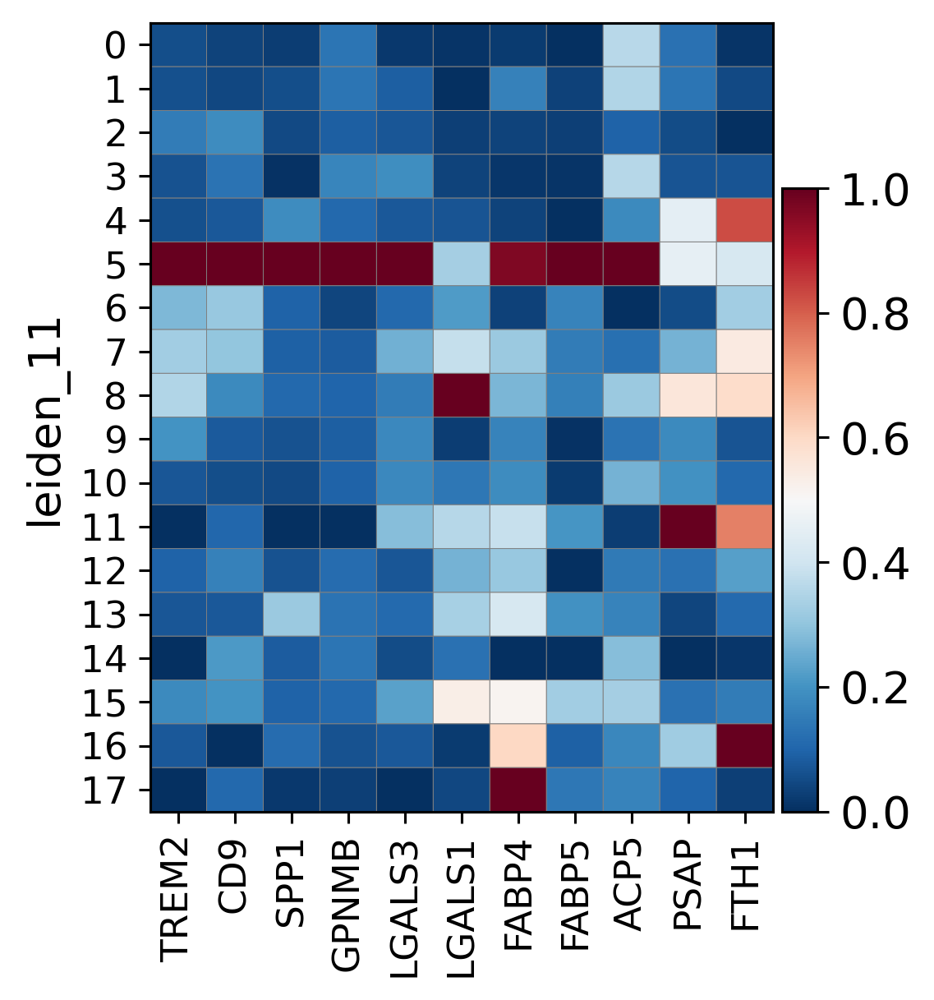

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.52, 0, 0.2])

In [184]:
sc.pl.matrixplot(MP_all_nobackground_harmony,
              ['TREM2', 'CD9', 'SPP1', 'GPNMB', 'LGALS3', 'LGALS1',
              'FABP4', 'FABP5', 'ACP5', 'PSAP', 'FTH1'],
              groupby='leiden_11', use_raw=True, standard_scale="var")

# Proliferation markers

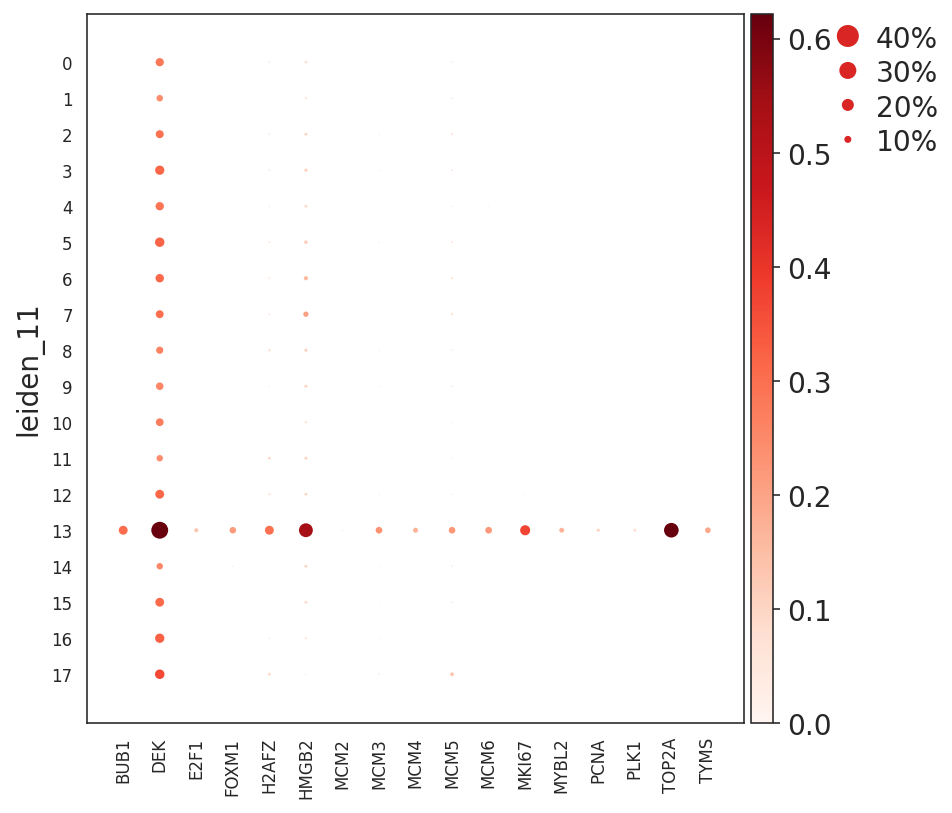

GridSpec(2, 5, height_ratios=[0, 10.5], width_ratios=[5.949999999999999, 0, 0.2, 0.5, 0.25])

In [387]:
sc.pl.dotplot(MP_all_nobackground_harmony,
              ['BUB1', 'DEK', 'E2F1', 'FOXM1', 'H2AFZ', 'HMGB2', 'MCM2', 'MCM3', 'MCM4', 'MCM5', 'MCM6', 'MKI67', 'MYBL2', 'PCNA', 'PLK1', 'TOP2A', 'TYMS'],
              groupby='leiden_11', use_raw=True)

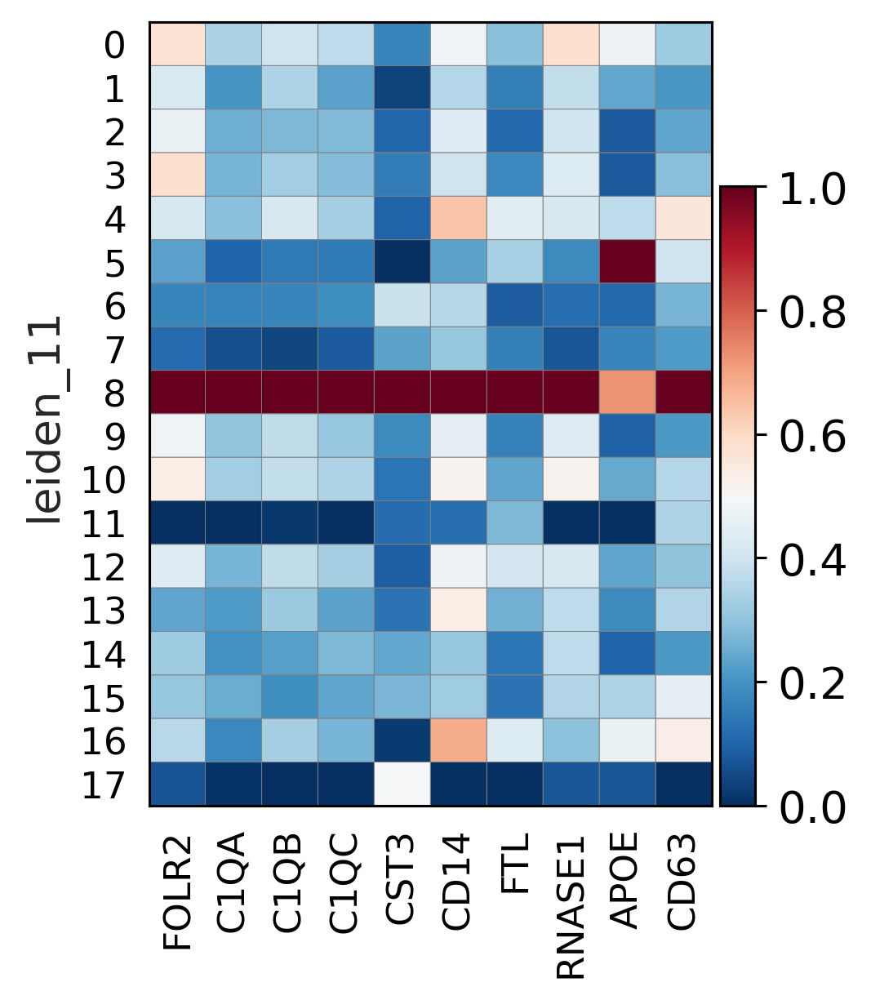

GridSpec(2, 3, height_ratios=[0, 10.5], width_ratios=[3.2, 0, 0.2])

In [244]:
# FOLR2+ macrophage markers (see reference list in manuscript)
sc.pl.matrixplot(MP_all_nobackground_harmony,
              ['FOLR2', 'C1QA', 'C1QB', 'C1QC',
               'CST3', 'CD14', 'FTL', 'RNASE1', 'APOE', 'CD63'
              ],
              groupby='leiden_11', use_raw=True, standard_scale="var")

In [ ]:
MP_all_nobackground_harmony.obs['cell_states_long']=MP_all_nobackground_harmony.obs['leiden_11']
subs = {
    "0": "MP_LYVE1hi/MHCII_lo",
    "1": "MP_LYVE1hi/MHCII_lo",
    "2": "MP_LYVE1lo/MHCII_hi",
    "3": "MP_LYVE1hi/MHCII_intermediate",
    "4": "MP_OSM",
    "5": "MP_TREM2",
    "6": "cDC2",
    "7": 'MO_VCAN', # S100A8, S100A9, SELL, (overlap with ITGAX (CD11c) with Mo) with weak expression of MP markers
    "8": "MP_FOLR2", # M2-like MP - or TIMD4? But TIMD4 is in MY14 high
    "9": "MP_transitional",
    "10": "MP_ISG", #(IFNstim genes)
    "11": "MO_CD16", #('FCGR3A', 'ITGAX', 'ITGA4', 'CX3CR1', 'TCF7L2', 'WARS', 'FCAR')
    "12": "unclassified.MP1",
    "13": "prolif_Myeloids",
    "14": "unclassified.MP2",
    "15": "unclassified.MP3",
    "16": "MP_NFkB",     # TNF+ (also in Mo), NFkB+ p65 high (RELA), NLRP3+IL1B (inflammasome activation) https://www.nature.com/articles/sigtrans201723, NFKBIA+NFKBIB (IkBA+B) (strimulators of NFKB), 
    "17":"cDC1" # cDC1
     } 


x=[subs.get(item,item)  for item in MP_all_nobackground_harmony.obs['cell_states']]
MP_all_nobackground_harmony.obs['cell_states']=x
pd.value_counts(MP_all_nobackground_harmony.obs['cell_states'])/MP_all_nobackground_harmony.shape[0]

In [49]:
#MP_all_nobackground_harmony.write(path_out+"/Myeloid_NODOUBLET_ANNOTATED.h5ad")
MP_all_nobackground_harmony=sc.read_h5ad(path_out+"/Myeloid_NODOUBLET_ANNOTATED.h5ad")

In [54]:
MP_all_nobackground_harmony.obs.to_csv(path_out+"/Myeloid_NODOUBLET_ANNOTATED_OBS.csv")#.write(path_out+"/Myeloid_NODOUBLET_ANNOTATED.h5ad")